In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/image-colorization/inception_resnet_v2_weights_tf_dim_ordering_tf_kernels.h5
/kaggle/input/image-colorization/ab/ab/ab3.npy
/kaggle/input/image-colorization/ab/ab/ab1.npy
/kaggle/input/image-colorization/ab/ab/ab2.npy
/kaggle/input/image-colorization/l/gray_scale.npy


# Getting Dataset

In [2]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [3]:
import numpy as np
import cv2
from tqdm import tqdm

In [4]:
gray_np = np.load("/kaggle/input/image-colorization/l/gray_scale.npy")
ab_1_np = np.load("/kaggle/input/image-colorization/ab/ab/ab1.npy")

In [5]:
gray_np.shape

(25000, 224, 224)

In [6]:
ab_1_np.shape

(10000, 224, 224, 2)

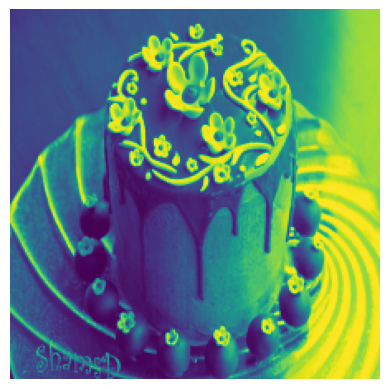

In [7]:
import matplotlib.pyplot as plt

# Display the image
plt.imshow(gray_np[2])
plt.axis('off')  # Turn off axis labels
plt.show()

In [8]:
def from_lab_to_rgb(gray_images,ab_images,n):
    Zeros_Imp = np.zeros((n,224,224,3))
    
    Zeros_Imp[:,:,:,0] = gray_images[0:n:]
    Zeros_Imp[:,:,:,1:] = ab_images[0:n:]
    
    Zeros_Imp = Zeros_Imp.astype("uint8")
    
    Main_Img = []
    
    for indexing in range(0,n):
        Main_Img.append(cv2.cvtColor(Zeros_Imp[indexing],cv2.COLOR_LAB2RGB))
        
    Main_Img = np.array(Main_Img)
    
    return Main_Img

In [9]:
# rgb_np = from_lab_to_rgb(gray_np, ab_1_np, 10000)

In [10]:
# rgb_np.shape

(10000, 224, 224, 3)

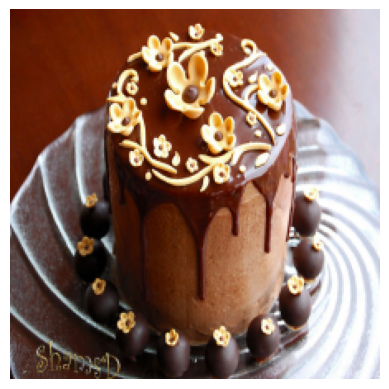

In [11]:
# # Display the image
# plt.imshow(rgb_np[2])
# plt.axis('off')  # Turn off axis labels
# plt.show()

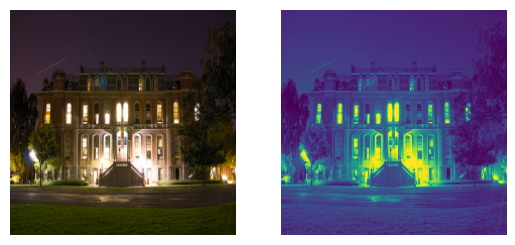

In [12]:
image_no = 9999
plt.subplot(1, 2, 1)
plt.imshow(rgb_np[image_no])
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(gray_np[image_no])
plt.axis('off')  # Turn off axis labels

plt.show()

In [13]:
# Copying same channel to 3 channels for VGG input
def line_image(gray_images):
    Zeros_Imp = np.zeros((gray_images.shape[0],224,224,3))
    for indexing in range(0,3):
        Zeros_Imp[:,:,:,indexing] = gray_images[:]
        
    return Zeros_Imp

In [14]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

In [15]:
# preprocess = transforms.Compose([
#     transforms.Resize(256, interpolation=transforms.functional.InterpolationMode.BILINEAR), 
#     transforms.CenterCrop(224),  
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), 
# ])

In [16]:
preprocess = transforms.Compose([
    transforms.Resize(256, interpolation=transforms.functional.InterpolationMode.BILINEAR), 
    transforms.CenterCrop(224),  
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485], std=[0.229]), 
])

In [17]:
class CustomDataset(Dataset):
    def __init__(self, line_images, ab_images, transform=None):
        self.line_images = line_images
        self.ab_images = ab_images
        self.transform = transform

    def __len__(self):
        return len(self.line_images)

    def __getitem__(self, idx):
        line_img_np = self.line_images[idx]
        ab_img_np = self.ab_images[idx]
        
        # Converting into PIL image
        line_img_pil = Image.fromarray(line_img_np.astype(np.uint8))
        ab_img_pil = Image.fromarray(ab_img_np.astype(np.uint8))

       # Applying transformations to input for training
        if self.transform:
            line_img_pil = self.transform(line_img_pil)

        return line_img_pil, ab_img_np

In [18]:
gray_np = gray_np[:10000]
g_1 = line_image(gray_np)
ab_1 = ab_1_np[:10000]
dataset = CustomDataset(gray_np, ab_1, preprocess)

In [19]:
dataset[0][0].shape

torch.Size([1, 224, 224])

In [20]:
dataset[0][1].shape

(224, 224, 2)

In [21]:
batch_size = 16
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [22]:
for batch in data_loader:
    x1,y1 = batch
    print(x1.shape)
    print(y1.view(-1,2,224,224).shape)
    break

torch.Size([16, 1, 224, 224])
torch.Size([16, 2, 224, 224])


In [23]:
y1[0].shape

torch.Size([224, 224, 2])

# Defining Model

In [24]:
from torchvision import models
import torch.nn as nn
import torch

In [25]:
class VGG19_desired_layers(nn.Module):
    def __init__(self):
        super(VGG19_desired_layers, self).__init__()
        
        weights = models.VGG19_Weights.IMAGENET1K_V1
        vgg19 = models.vgg19(weights=weights)
        for param in vgg19.parameters():
            param.requires_grad = False 
        self.features = vgg19.features # This excludes the final classification layers of VGG
        self.layer_indices = [3, 8, 17, 26, 35] # End of eacg 'blocks' in VGG 19
        
    def forward(self, x):
        output = []
        for i, layer in enumerate(self.features):
            x = layer(x)
            if i in self.layer_indices:
                #print(f"Dimension of x after layer {i} : {x.shape}")
                output.append(x)
        return output # stores all outputs from feature extraction layers

In [26]:
# Defining class for matching all extracted features shapes
class Hypercolumns(nn.Module):
    def __init__(self):
        super(Hypercolumns, self).__init__()
        
        self.upscale1 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.upscale2 = nn.Upsample(scale_factor=4, mode='bilinear', align_corners=False)
        self.upscale3 = nn.Upsample(scale_factor=8, mode='bilinear', align_corners=False)
        self.upscale4 = nn.Upsample(scale_factor=16, mode='bilinear', align_corners=False)
        
    def forward(self, features):
        hyper_columns = []
        hyper_columns.append(features[0])
        hyper_columns.append(self.upscale1(features[1]))
        hyper_columns.append(self.upscale2(features[2]))
        hyper_columns.append(self.upscale3(features[3]))
        hyper_columns.append(self.upscale4(features[4]))
        
        return torch.cat(hyper_columns, dim=1) # stacking all extracted features after upscaling to match dimensions of each channel

In [27]:
class Image_Colorization(nn.Module):
    def __init__(self):
        super(Image_Colorization, self).__init__()
        
        self.vgg19 = VGG19_desired_layers() 
        
        self.hypercolumns = Hypercolumns()
        
        self.conv = nn.Conv2d(1,3, (1,1)) 
        self.conv1 = nn.Conv2d(1472, 64, (1,1))
        self.conv2 = nn.Conv2d(64, 16, (1,1))
        self.conv3 = nn.Conv2d(16, 2, (1,1))
        
    def forward(self, x):
        x = self.conv(x)
        x = self.vgg19(x)
        x = self.hypercolumns(x) # outputs a concatenated tensor with (64+128+256+512+512) channels of 224x224 size each
        x = self.conv1(x)
        x = self.conv2(x)
        return self.conv3(x) # Final conV layer to output 2 channels of size 224x224

In [28]:
def view_images(img1, img2):
    fig, axes = plt.subplots(1, 2)  # Create a figure with 1 row and 2 columns of axes
    
    # Plot the first image on the left axis
    axes[0].imshow(img1 / 255)
    axes[0].set_title('Image 1')  # Set title for the left image
    
    # Plot the second image on the right axis
    axes[1].imshow(img2 / 255)
    axes[1].set_title('Image 2')  # Set title for the right image
    
    plt.show()

In [29]:
def test_one(Model, device, gray_np, ab_1_np):
    with torch.no_grad():
        test_g = gray_np[0]
        test_g_l = np.expand_dims(gray_np[0], axis=0)
        test_ab = ab_1_np[0]
    
        test_ab = torch.tensor(test_ab, dtype=torch.float, device=device)
    
        Model.eval()
        # Converting gray image to desired input form
        test_g_l = np.squeeze(test_g_l) 
        test_g_l = Image.fromarray(test_g_l.astype(np.uint8))
        test_g_l = preprocess(test_g_l)
        test_g_l = torch.unsqueeze(test_g_l, dim=0)
        test_g_l = test_g_l.to(device)
        # Getting predicted coloured image
        test_ab_hat = Model(test_g_l)
        # Getting true coloured image in desired form
        test_ab = torch.unsqueeze(test_ab, dim=0)
        test_ab_hat = test_ab_hat.view(-1, 224, 224, 2)
        test_g = np.expand_dims(test_g, axis=0)
        # Predicted coloured image
        img = from_lab_to_rgb(test_g, test_ab_hat.cpu().numpy(), 1)
        # Real coloured image
        img_ = from_lab_to_rgb(test_g, test_ab.cpu().numpy(), 1)
        print("Testing on Image ....")
        view_images(img[0], img_[0])

In [30]:
Model = Image_Colorization()
Model.to(device)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 171MB/s]  


Image_Colorization(
  (vgg19): VGG19_desired_layers(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReL

In [31]:
# import torch
# import torch.nn as nn
# import torch.nn.functional as F

# class ColorSensitiveLoss(nn.Module):
#     def __init__(self, alpha=1.0, beta=1.0, gamma=0.1):
#         super(ColorSensitiveLoss, self).__init__()
#         self.alpha = alpha
#         self.beta = beta
#         self.gamma = gamma

#     def forward(self, predicted_lab, target_lab):
#         # Compute perceptual loss using pre-trained VGG19
#         perceptual_loss = F.mse_loss(predicted_lab, target_lab)  # You can replace this with perceptual loss using VGG19

#         # Compute chroma loss
#         chroma_loss = F.mse_loss(predicted_lab[:, 1:], target_lab[:, 1:])  # Exclude L channel

#         # Compute total variation regularization
#         tv_loss = torch.mean(torch.abs(predicted_lab[:, :, :, :-1] - predicted_lab[:, :, :, 1:])) + \
#                   torch.mean(torch.abs(predicted_lab[:, :, :-1, :] - predicted_lab[:, :, 1:, :]))

#         # Combine losses
#         total_loss = self.alpha * perceptual_loss + self.beta * chroma_loss + self.gamma * tv_loss

#         return total_loss

# # Example usage:
# criterion = ColorSensitiveLoss(alpha=1.0, beta=1.0, gamma=0.1)

In [32]:
criterion = nn.MSELoss(reduction="mean")
optimizer = torch.optim.Adam(Model.parameters(), lr=1e-3)
epochs = 10

Testing on Image ....


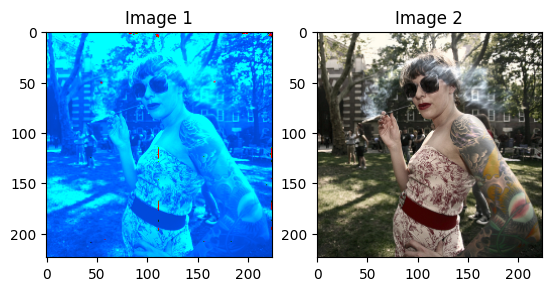

In [33]:
test_one(Model, device, gray_np, ab_1_np)

In [34]:
torch.cuda.empty_cache()

In [35]:
torch.cuda.memory_allocated()/1024**2

76.75390625

In [36]:
torch.cuda.memory_cached()/1024**2

/opt/conda/lib/python3.10/site-packages/torch/cuda/memory.py:444: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  warnings.warn(


102.0

100%|██████████| 625/625 [08:37<00:00,  1.21it/s]


Testing on Image ....


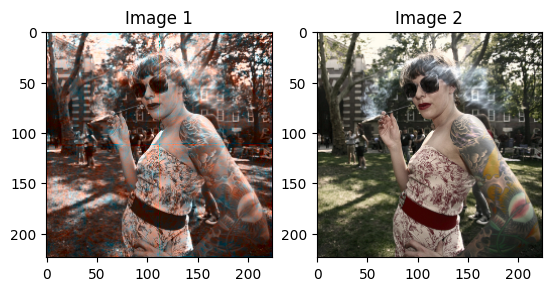

1/10 Loss: 1380.0114968017579


100%|██████████| 625/625 [08:37<00:00,  1.21it/s]


Testing on Image ....


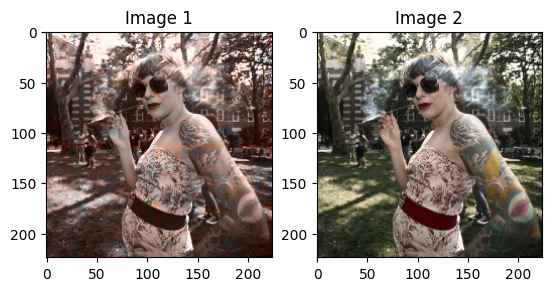

2/10 Loss: 309.15226989746094


100%|██████████| 625/625 [08:37<00:00,  1.21it/s]


Testing on Image ....


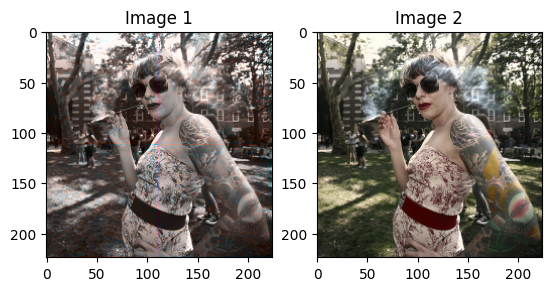

3/10 Loss: 285.76901419677733


100%|██████████| 625/625 [08:37<00:00,  1.21it/s]


Testing on Image ....


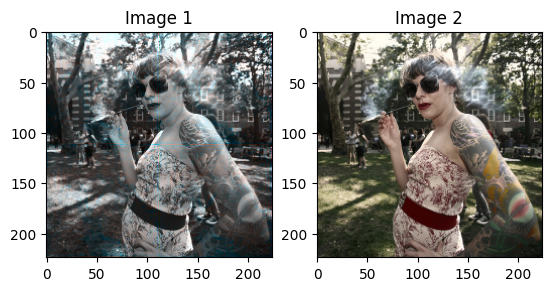

4/10 Loss: 279.965048034668


100%|██████████| 625/625 [08:37<00:00,  1.21it/s]


Testing on Image ....


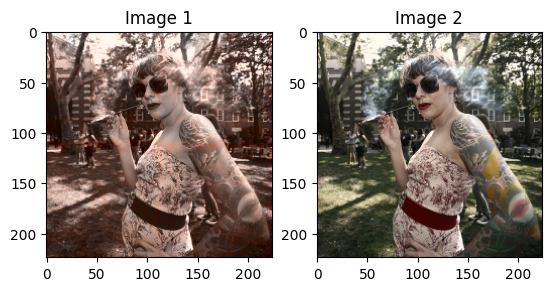

5/10 Loss: 278.49733864746094


100%|██████████| 625/625 [08:37<00:00,  1.21it/s]


Testing on Image ....


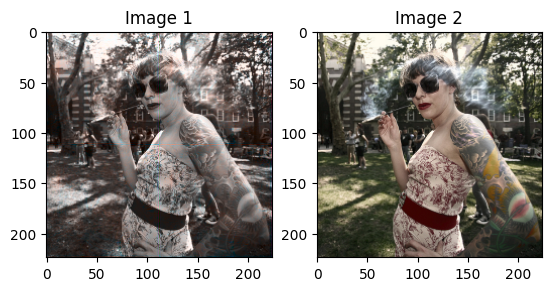

6/10 Loss: 275.39202508544923


100%|██████████| 625/625 [08:37<00:00,  1.21it/s]


Testing on Image ....


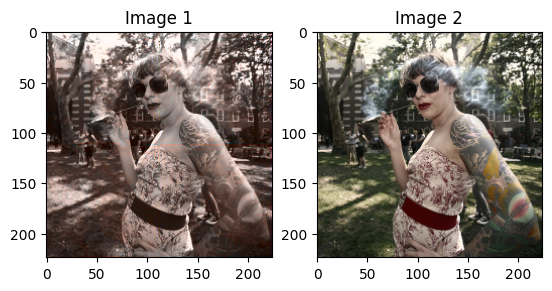

7/10 Loss: 275.3043110961914


100%|██████████| 625/625 [08:37<00:00,  1.21it/s]


Testing on Image ....


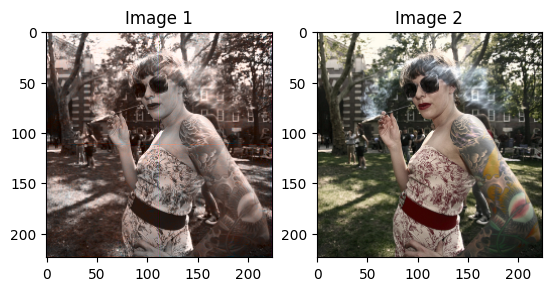

8/10 Loss: 274.8737912841797


100%|██████████| 625/625 [08:37<00:00,  1.21it/s]


Testing on Image ....


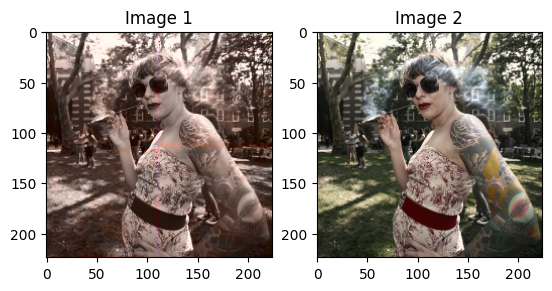

9/10 Loss: 273.63132651367187


100%|██████████| 625/625 [08:37<00:00,  1.21it/s]


Testing on Image ....


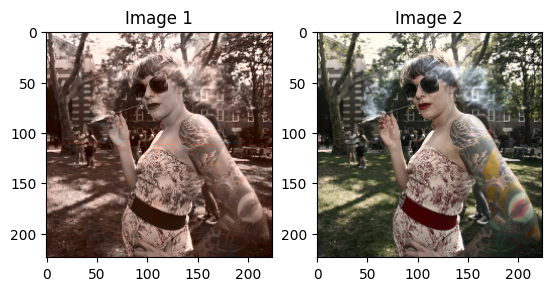

10/10 Loss: 271.83309593505857


In [37]:
for epoch in range(epochs):
    loss_i = 0
    for batch in tqdm(data_loader):
        Model.train()
        x, y = batch
        x = x.float() 
        y = y.float() 
        x = x.to(device)
        y = y.to(device)
        y_hat = Model(x)
        loss_b = criterion(y_hat, y.view(-1,2,224,224))
        
        optimizer.zero_grad()
        loss_b.backward()
        optimizer.step()
        
        loss_i += loss_b.item()
    if ((epoch+1)%1==0):
        test_one(Model, device, gray_np, ab_1_np)
        
    print(f"{epoch+1}/{epochs} Loss: {loss_i/len(data_loader)}")

In [38]:
torch.save(Model, "Image_Colorization_VGG19.pt")

Testing on Image ....


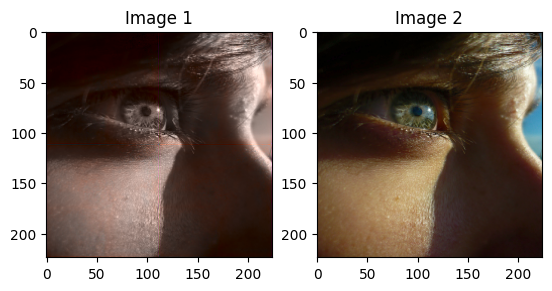

Testing on Image ....


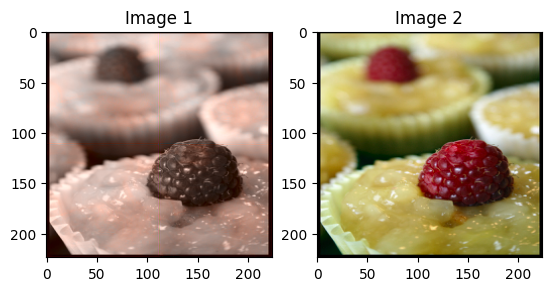

Testing on Image ....


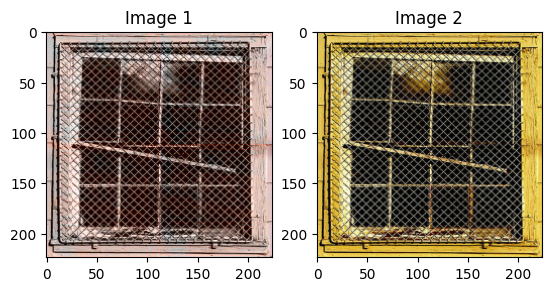

Testing on Image ....


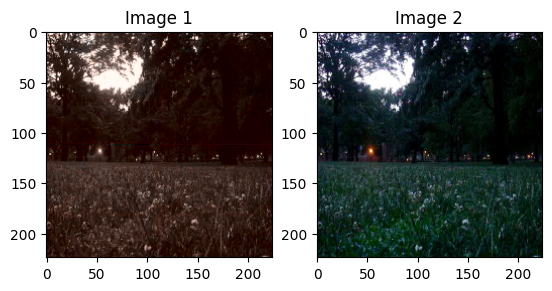

Testing on Image ....


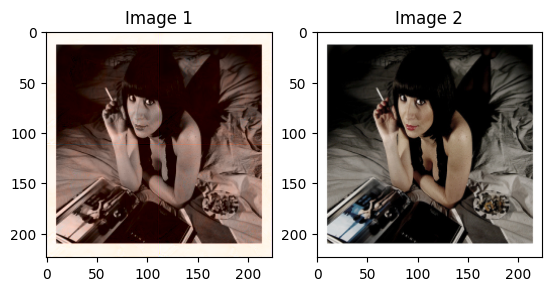

Testing on Image ....


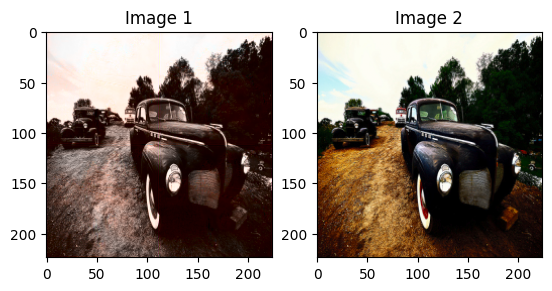

Testing on Image ....


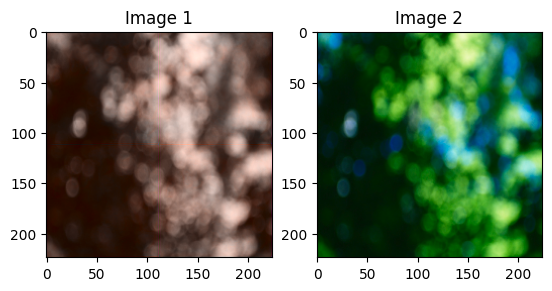

Testing on Image ....


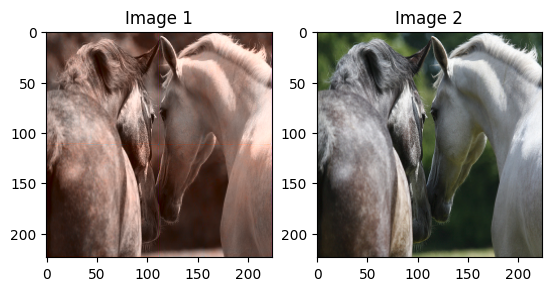

Testing on Image ....


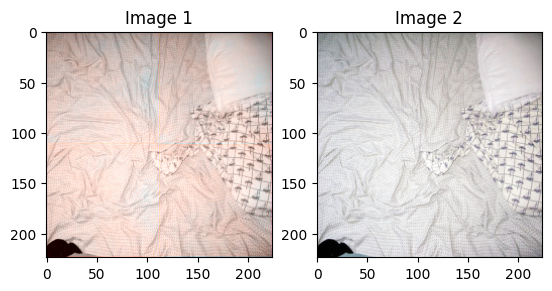

Testing on Image ....


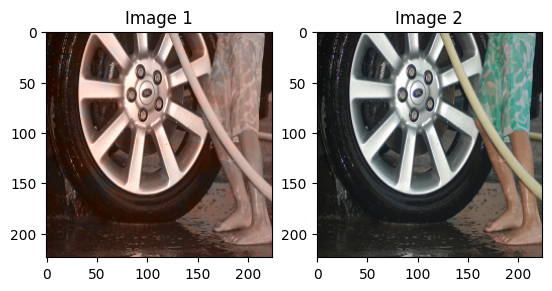

Testing on Image ....


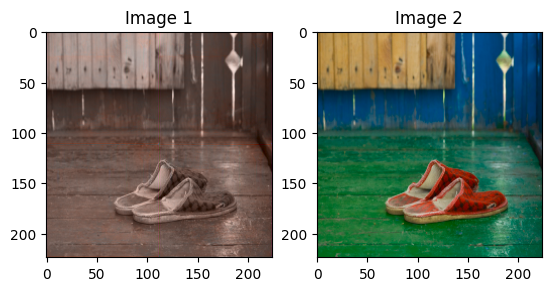

Testing on Image ....


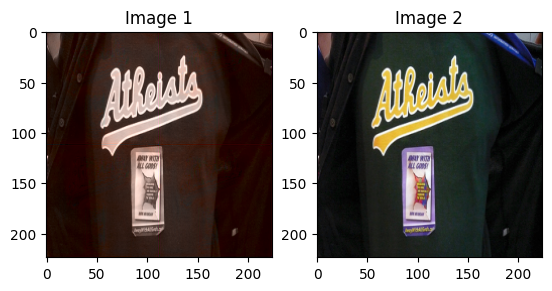

Testing on Image ....


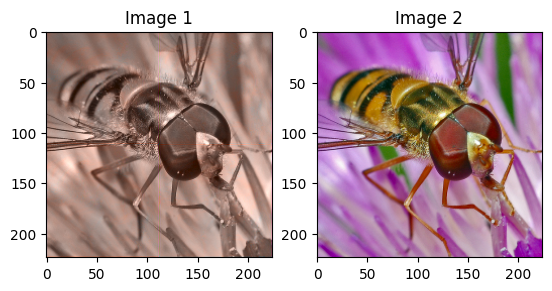

Testing on Image ....


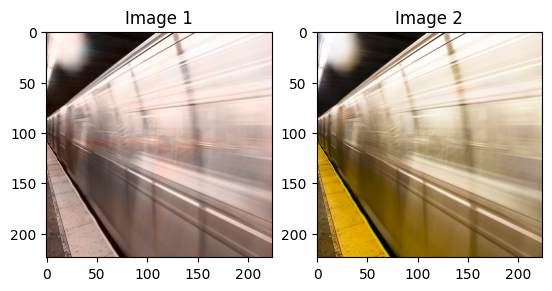

Testing on Image ....


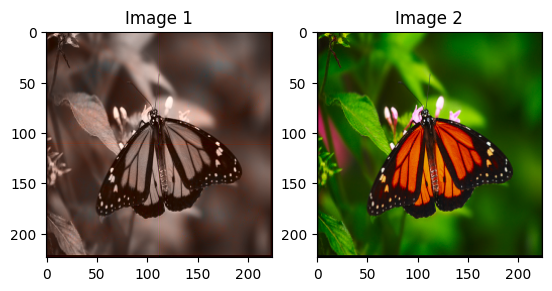

Testing on Image ....


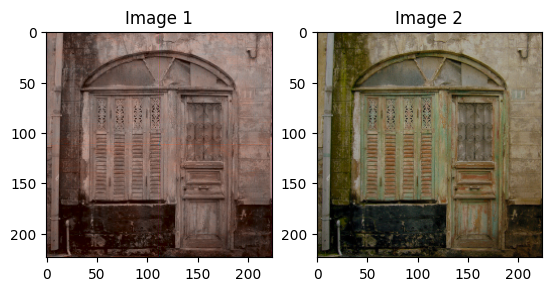

Testing on Image ....


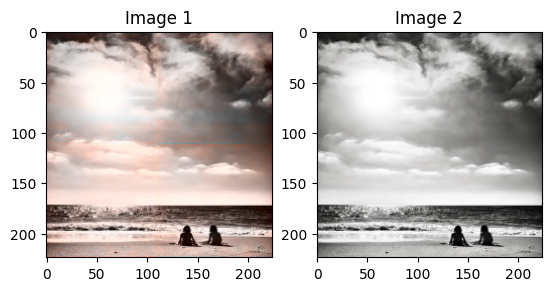

Testing on Image ....


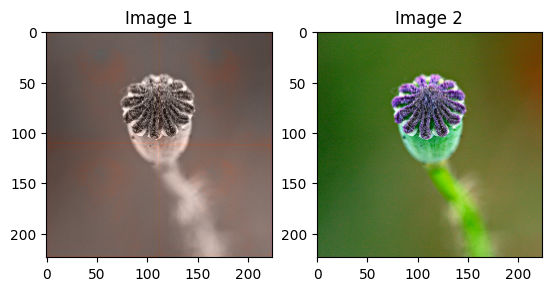

Testing on Image ....


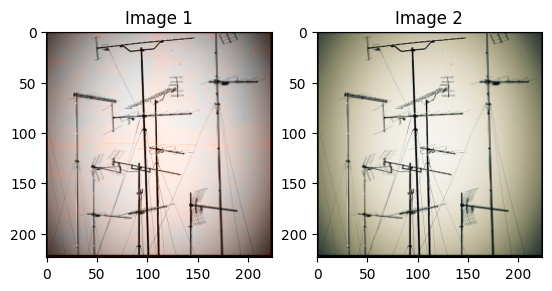

Testing on Image ....


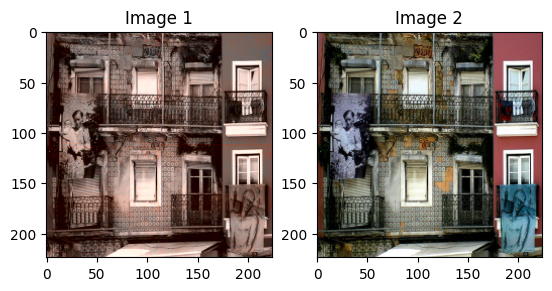

Testing on Image ....


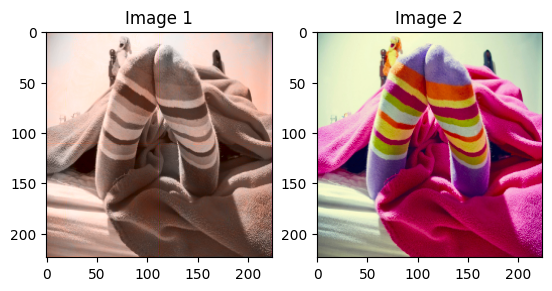

Testing on Image ....


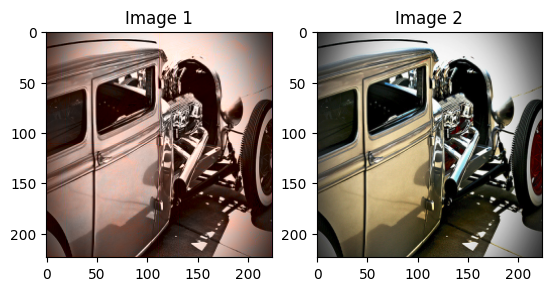

Testing on Image ....


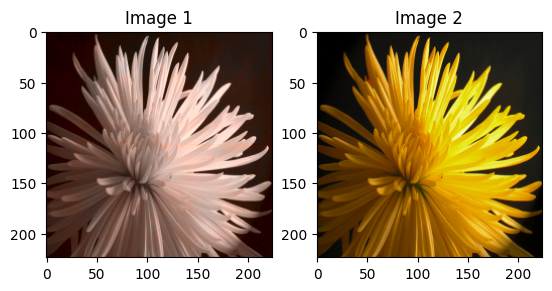

Testing on Image ....


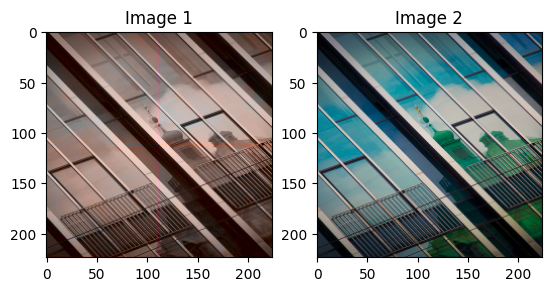

Testing on Image ....


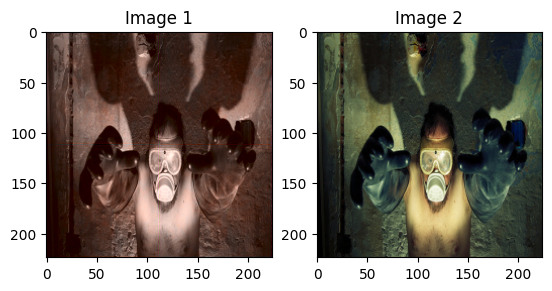

Testing on Image ....


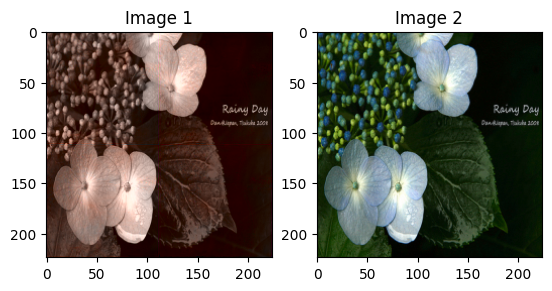

Testing on Image ....


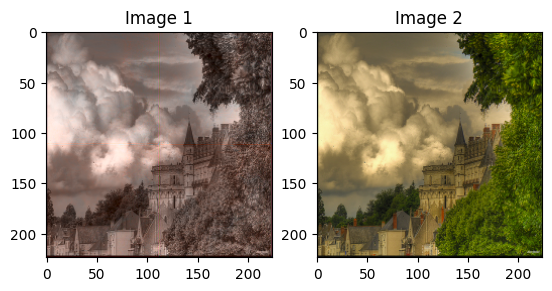

Testing on Image ....


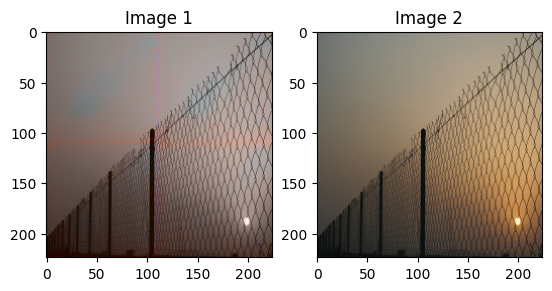

Testing on Image ....


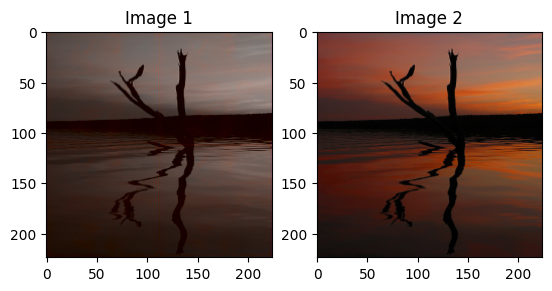

Testing on Image ....


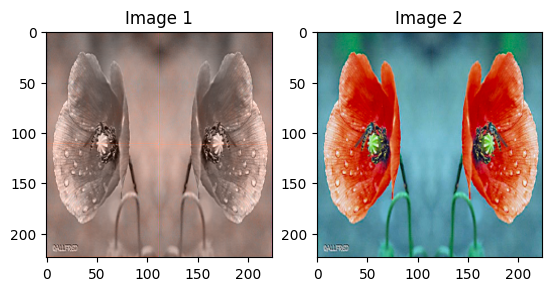

Testing on Image ....


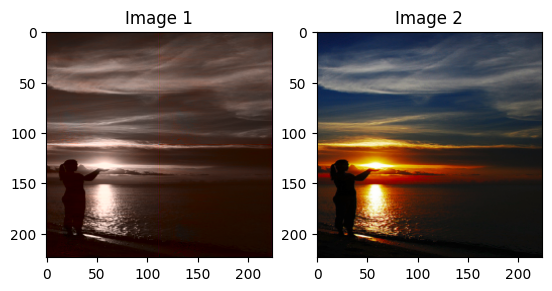

Testing on Image ....


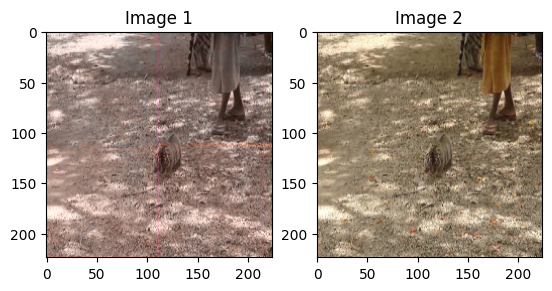

Testing on Image ....


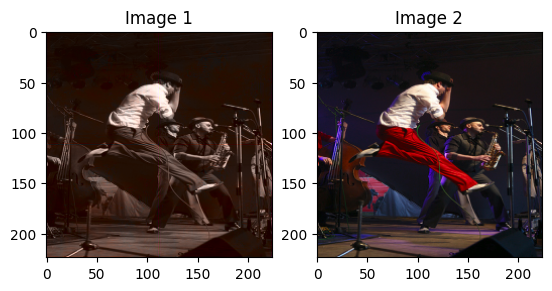

Testing on Image ....


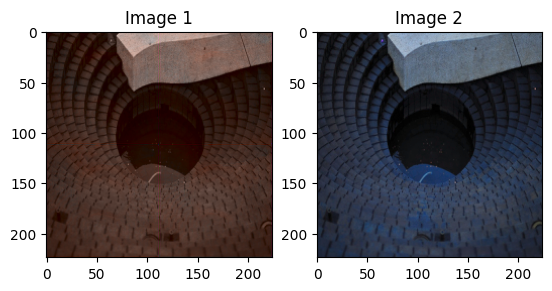

Testing on Image ....


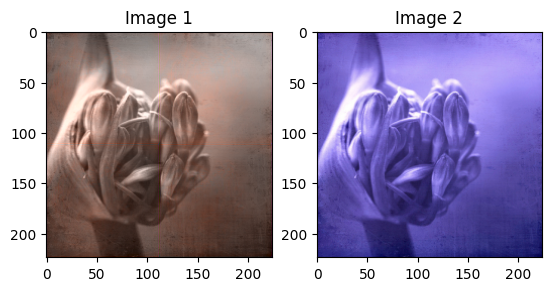

Testing on Image ....


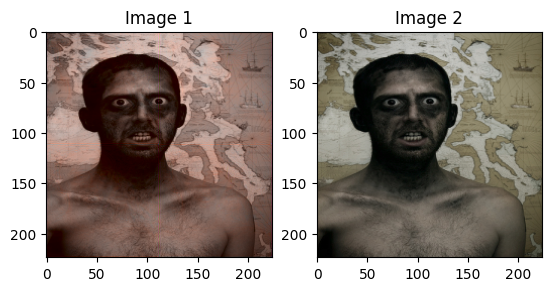

Testing on Image ....


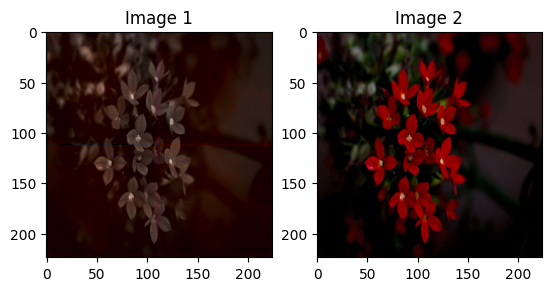

Testing on Image ....


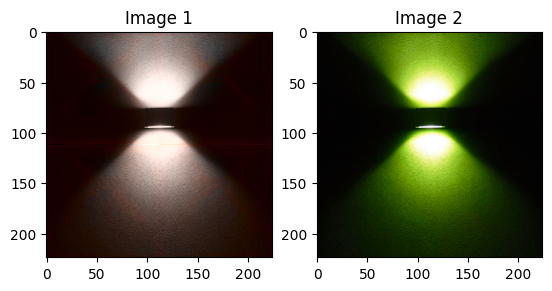

Testing on Image ....


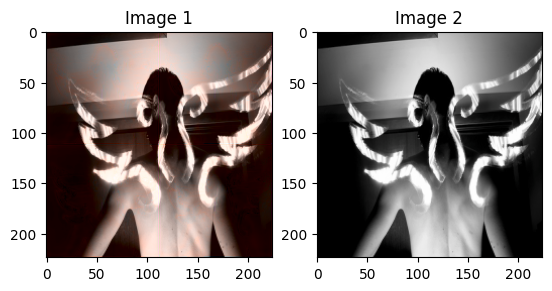

Testing on Image ....


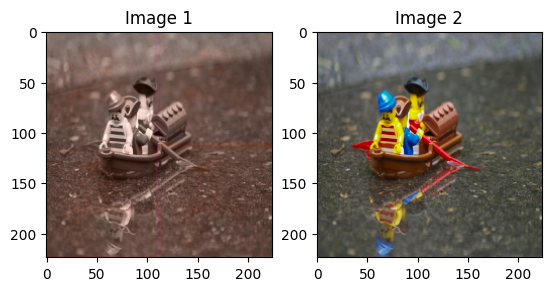

Testing on Image ....


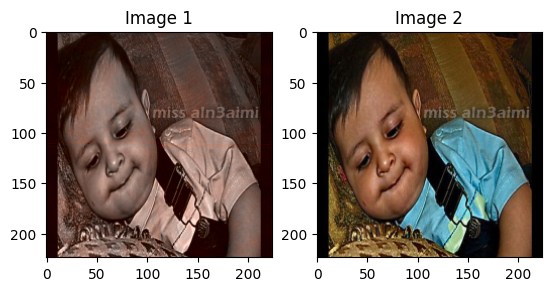

Testing on Image ....


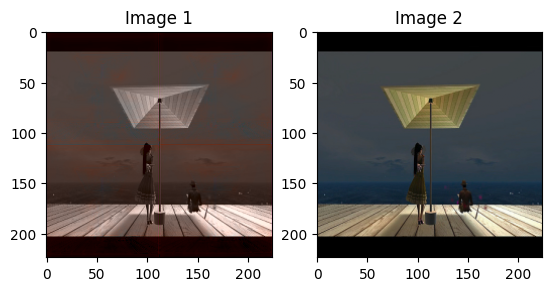

Testing on Image ....


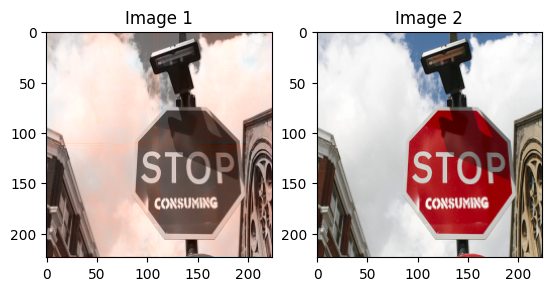

Testing on Image ....


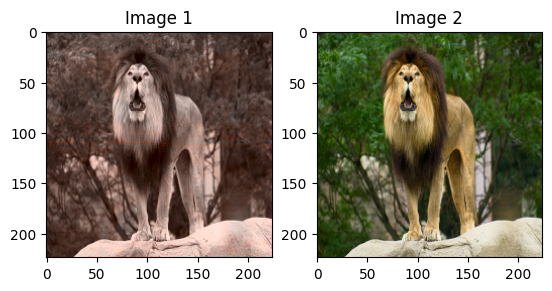

Testing on Image ....


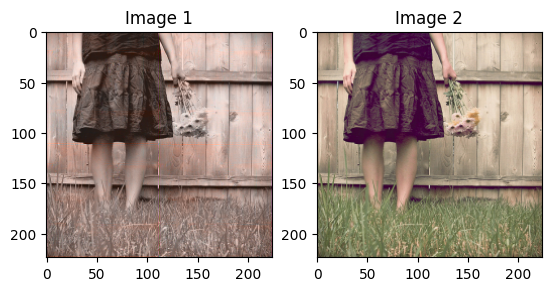

Testing on Image ....


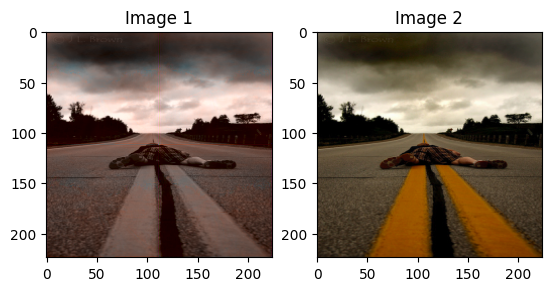

Testing on Image ....


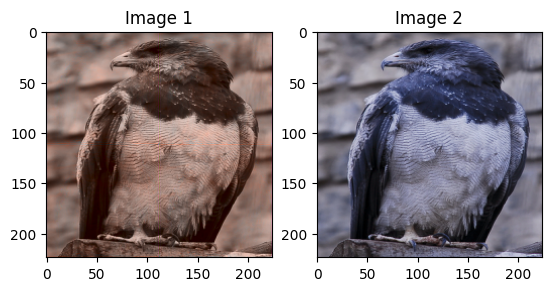

Testing on Image ....


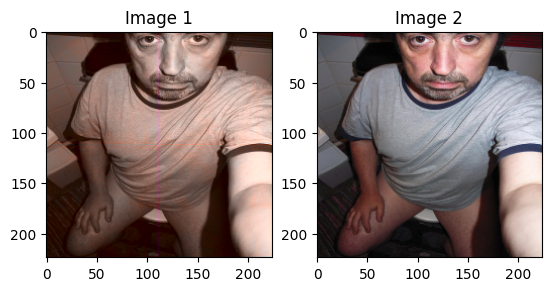

Testing on Image ....


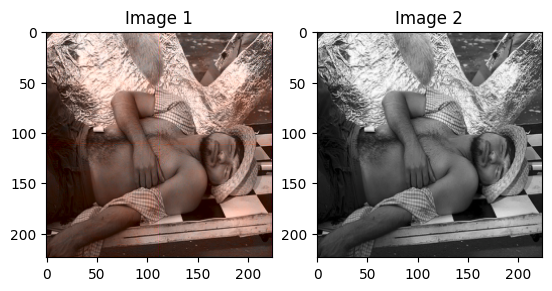

Testing on Image ....


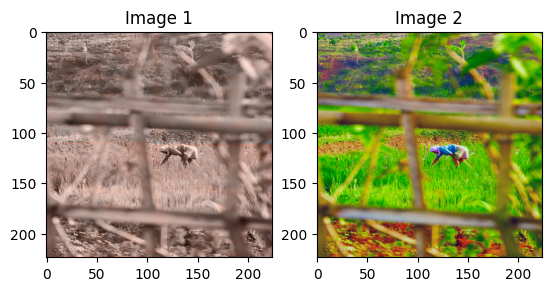

In [39]:
for i in range(50,100):
    test_one(Model, device, gray_np[i:], ab_1_np[i:])

Input is a Greyscale image with output as Lab image, which may be converted into RGB using the defined function